## Objective

The goal of this assignment is to write custom functions to manipulate and augment images.


Artificial Intelligence models require data to learn how to solve a task. For vision related tasks, many problems don't have enough data to train a model.

If a model is not trained on sufficiently large dataset with diverse examples from varoius geographical locations, backgrounds, races, 
genders, AI will perform poorly in that task when it sees an example that was not part of its dataset.

[Here is a related article to understand how dataset size affects model performance](https://news.mit.edu/2022/machine-learning-biased-data-0221)

* **If researchers are training a model to classify cars in images, they want the model to learn what different cars look like. But if every Ford Thunderbird in the training dataset is shown from the front, when the trained model is given an image of a Ford Thunderbird shot from the side, it may misclassify it, even if it was trained on millions of car photos.**

## But what if you don't have enough images for training an algorithm?

### Data augmentation

Data Augmentation is a very powerful method to increase you dataset size. Let's say you are working on creating a software for a hospital that processes chest X-rays to understand different conditions of patient's organs. This software will do preliminary screening to help find the most relevant doctor/advanced test to perform next for helping the doctor in diagnosis.

For many medical conditions we will not have enough images available as the condition may be rare among patients.
But to create the system, we need to teach the model how to detect the conditions by giving it images with (positively diagnosed) and without (healthy) the condition and in many possible forms (angle, low lights, partial image, etc.)  so that works for many different scenarios.

**Data augmentation can achieve this.**

The augmented data will represent a more comprehensive set of possible data points, thus minimizing the distance between the data used for training the model and the data it will encounter when applied in real scenario.

Here is a paper of different augmentation techniques for images, used for satellite images studying forest health, artistic work creation, understanding the roads and oceans -- for getting a better performing AI system.

[Research Paper on augmentation](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-019-0197-0)

## Accessing a single channel of an image

When we separate the channels, they become 2D array of pixel values corresponding channels. They no longer
remain a combination of 3 separate channels (for RGB) images. And that can an easy way to augment (increase 
number of data points) your dataset with more data as you get 3 images for each image.

**Let's explore this**

In [ ]:
## import libraries
from IPython.display import display
from PIL import Image

# Open an image file
image = Image.open("illusion1.jpg")
display(image)

This is an optical illusion image where due to [Moire effect](https://www.smithsonianmag.com/science-nature/these-patterns-move-but-its-all-an-illusion-1092906/) it feels like the pinwheels are moving. 

### Let's access individual channels of the image.

In [ ]:
%pip install numpy opencv-python #install openCV, only run this once at the beginning

In [ ]:
#using split to separate the channels
r_channel, g_channel, b_channel = image.split() 

#print and display
print('R channel')
display(r_channel)

print('G channel')
display(g_channel)

print('b channel')
display(b_channel)


## Merge the channels back again to get the original image

In [ ]:
original_image = Image.merge("RGB", (r_channel, g_channel, b_channel))
display(original_image)

### What differences do you observe from each of these single channel image? Write in the cell below briefly. ###












# Your answer here








## Professor Chowdhury excused me from completing this part



## What happens to the image if we manipulate pixel values of a channel?

In [ ]:
# accessing red channel and setting it to zero, see: https://pillow.readthedocs.io/en/stable/reference/Image.html
# using r_channel.size to get the height and width of the r_channel matrix
zero_r_channel = Image.new("L", r_channel.size, 0)

original_image = Image.merge("RGB", (r_channel, zero_r_channel, b_channel))
display(original_image)

### Perform the same operation for g and b channel and display. ###





In [ ]:



## Professor Chowdhury excused me from completing this part



### What observations or differences you see? ###

## Your answer here








## Professor Chowdhury excused me from completing this part ##

**You have created three augmented version of the original image that you can use as additional data! Congratulations!**

## Task 1 (10pts)

**For the following tasks, mention which of the example images provided you used for testing your function in a comment above your code.**

**We have provided an example folder `augmented_images_examples` with sample output. Use any of the other images.**


1) Write a function `augment_image()` that will take `image_file_path` as the argument and apply different transformation methods available on pillow and will save the resulant images in a folder called `augmented_image`. (1pt)

2) When we pass a specific image file path to the function, the function will execute, apply the transformation, and save the augmented images in the folder `augmented_images`. (1pt)

You can apply the following transformation (you have seen most of them from project 1):

* rotate by 45 degrees. (1pt)
* resizing images to (200, 200) resolution (1pt)
* flip the image. (1pt)
* crop a (400, 400) patch from it (1pt)
* increase/decrese brightness by 50% (1pt)
* increase the constrast by 50% (1pt)
* blur the image using filter (1pt)
* sharpen te image by using filter (1pt)

Hint: you may use [this](https://pillow.readthedocs.io/en/stable/reference/Image.html), [this](https://pillow.readthedocs.io/en/stable/reference/ImageEnhance.html), and [this](https://pillow.readthedocs.io/en/stable/reference/ImageFilter.html) module for this.

**Apply at LEAST 8 transformations so that we have 9 images (original and 8 augmented ones).**

Grade distribution: (1 X 8 +  1 + 1) = 10pts (8 transformtaion, 1 for reading the image, 2 for saving the image).



In [21]:
## I am using "illusion3.jpg"

## Your code goes here

from PIL import Image, ImageEnhance, ImageFilter

def augment_image(image_path):
    # Open the original image
    original_image = Image.open(image_path)

    # Create a list to store augmented images
    augmented_images = []

    # Augmentation 1: Rotate the image by 45 degrees

    rotated_image = original_image.rotate(45)
    augmented_images.append(rotated_image)

    # Augmentation 2: Resize the image to 200x200 pixels

    resized_image = original_image.resize((200, 200))
    augmented_images.append(resized_image)

    # Augmentation 3: Crop a region defined by coordinates (left, upper, right, lower)

    crop_box=(0, 0, 400, 400)
    cropped_image = original_image.crop(crop_box)
    augmented_images.append(cropped_image)

    # Augmentation 4: Flip the image horizontally (left to right)
    flipped_image = original_image.transpose(Image.FLIP_LEFT_RIGHT)
    augmented_images.append(flipped_image)

    # Augmentation 5: Enhance brightness

    enhancer = ImageEnhance.Brightness(original_image)
    enhanced_brightness = enhancer.enhance(1.5)
    augmented_images.append(enhanced_brightness)

    # Augmentation 6: Enhance contrast

    enhancer2 = ImageEnhance.Contrast(original_image)
    enhanced_contrast = enhancer2.enhance(1.5)
    augmented_images.append(enhanced_contrast)

    # Augmentation 7: Apply Gaussian blur
    blurred_image = original_image.filter(ImageFilter.GaussianBlur(radius=4))
    augmented_images.append(blurred_image)

    # Augmentation 8: Apply sharpen filter
    sharpened_image = original_image.filter(ImageFilter.SHARPEN)
    augmented_images.append(sharpened_image)

    return augmented_images


image_path = "illusion3.jpg"
augmented_images = augment_image(image_path)


# Save augmented images
for i, augmented_image in enumerate(augmented_images):
    augmented_image.save(f"augmented_images/augmentimage_{i}.jpg")

## Task 2 (16 pts)

Write a function `create_image_puzzle(image_path, rows, columns, output_folder)` that will take an image and covert it to a puzzle. It will tak ethe following input:

image_path: The path of the input image

rows: Number of rows

columns: Number of columns

output_folder: The folder to save the puzzle tiles of the image

**You can structure the internal body of the function in other ways too, just please make sure the function takes the same arguments we mentioned in the project description.**

In [20]:
## I am using "illusion4.jpg"

from PIL import Image

def create_image_puzzle(image_path, rows, columns, output_folder):
    # Open the original image
   
    img = Image.open(image_path)

    # Get the dimensions of the original image
   
    image_width = img.size[0]

    image_height = img.size[1]

    # Calculate the dimensions of each puzzle piece
   
    piece_width = (image_width/columns)
    piece_height = (image_height/rows)

    # Create and save puzzle pieces
    for row in range(rows):
            for col in range(columns):
                
                crop_box = (col*piece_width, row*piece_height, (col+1)*piece_width, (row+1)*piece_height)
                piece = img.crop(crop_box)

        # Save the current tile to the output folder
        # piece is the resultant tile in the following line.
                piece.save(output_folder + "/" + "piece_%d_%d.jpg" %(row, col))


input_image_path = "illusion4.jpg"      #change this to image name of your preference
rows = 4
columns = 5
output_folder = "puzzled_pieces"

create_image_puzzle(input_image_path, rows, columns, output_folder)

## Task 3

Write a function `put_image_puzzle_back_together(input_folder, output_path, rows, columns)` that will put the tiles back togetehr to construct the original image.

The function will take following input:

input_folder: Folder location where puzzle tiles form the image are saved

output_path: The path of the output image (if you select `CS166_Project2`, it should be saved in the main directory where your notebook is)


**We have provided some instructions in the function body, but following them is optional. The key rule is your function should take the same set of arguments as we mentioned, and provide the desired output.**

In [19]:
import os

def put_image_puzzle_back_together(input_folder, output_path, rows, columns):

    # Get the list of puzzle piece file paths
    piece_files = sorted([f for f in os.listdir(input_folder) if f.startswith("piece_")])

    print('Number of pieces:', len(piece_files))
    if not piece_files:
        print("No puzzle pieces found in the folder.")
        return

    # Open the first puzzle piece to determine the dimensions
    first_piece = Image.open('puzzled_pieces/piece_0_0.jpg')
    piece_width, piece_height = (first_piece.size[0], first_piece.size[1])

    # Create a blank image to assemble the puzzle
    assembled_image = Image.new("RGB", (piece_width * columns, piece_height * rows))

    for row in range(rows):
        for col in range(columns):
            # Open the current puzzle piece
            piece = Image.open(input_folder + "/" + "piece_%d_%d.jpg" %(row, col))

            # Calculate the coordinates to paste each piece
            
            left = col*piece_width
            upper = row*piece_height
            right = left + piece_width
            lower = upper + piece_height
            
            assembled_image.paste(piece, (left, upper, right, lower))

    # Save the assembled image
    assembled_image.save('assembled_image.jpg')

# Example usage:
input_folder = "puzzled_pieces"
output_path = "CS166_Project2"
rows = 4
columns = 5

put_image_puzzle_back_together(input_folder, output_path, rows, columns)

Number of pieces: 20


Extension 1:

In [18]:
image_path = 'find_waldo.jpg'

image = Image.open(image_path)

image.size

(3000, 1975)

In [17]:
from PIL import Image
import os

def create_image_puzzle(image_path, rows, columns, output_folder):
    # Open the original image
   
    img = Image.open(image_path)

    # Get the dimensions of the original image
   
    image_width = img.size[0]

    image_height = img.size[1]

    # Calculate the dimensions of each puzzle piece
   
    piece_width = (image_width/columns)
    piece_height = (image_height/rows)

    # Create and save puzzle pieces
    for row in range(rows):
            for col in range(columns):
                
                crop_box = (col*piece_width, row*piece_height, (col+1)*piece_width, (row+1)*piece_height)
                piece = img.crop(crop_box)

        # Save the current tile to the output folder
        # piece is the resultant tile in the following line.
                piece.save(output_folder + "/" + "piece_%s_%d.jpg" %(row, col))

input_image_path = "find_waldo.jpg"
rows = 3
columns = 5
output_folder = "waldo_pieces_extension"

create_image_puzzle(input_image_path, rows, columns, output_folder)

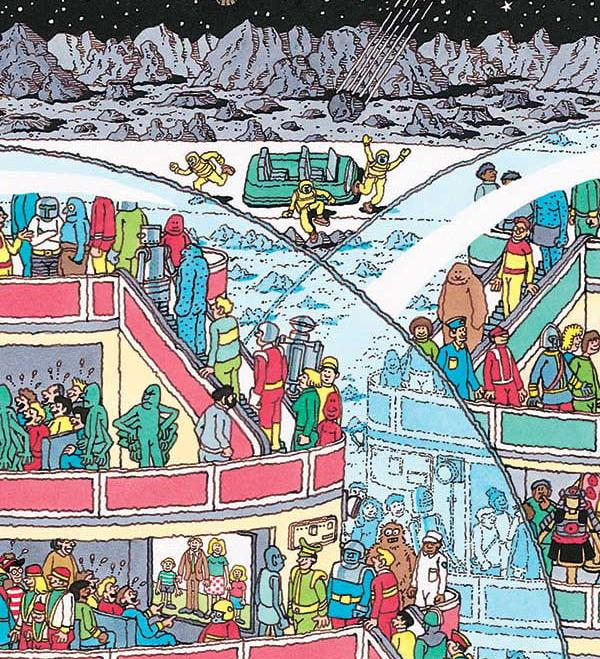

In [16]:
image_path = "waldo_pieces_extension/piece_1_2.jpg"

img = Image.open(image_path)

img.save('Waldo.jpg')

display(img)

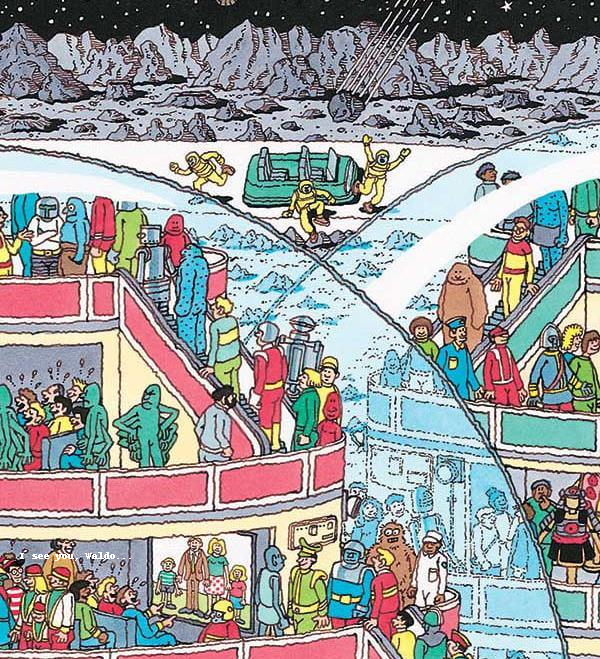

In [15]:
from PIL import Image, ImageDraw

image_path = 'Waldo.jpg'

with Image.open(image_path) as img2:

    draw = ImageDraw.Draw(img2)

parameters = (20, 550)

draw.text(parameters, "I see you, Waldo...", fill=None, font=None, anchor=None, spacing=4, align='left', direction=None, features=None, language=None, stroke_width=0, stroke_fill=None, embedded_color=False)

display(img2)

img2.save('Waldo_i_see_you.jpg')

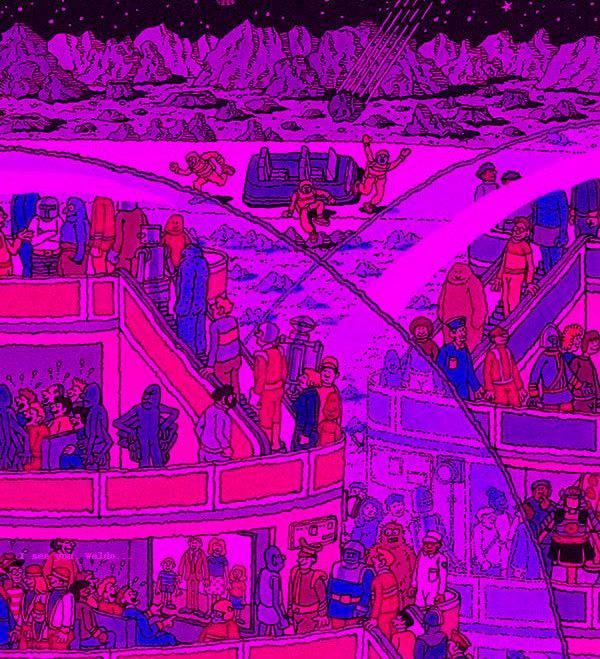

In [13]:
image_path = "Waldo_i_see_you.jpg"

image = Image.open(image_path)

r_channel, g_channel, b_channel = image.split() 

zero_r_channel = Image.new("L", r_channel.size, 0)

new_waldo = Image.merge("RGB", (r_channel, zero_r_channel, b_channel))
display(new_waldo)

new_waldo.save('editied_waldo.jpg')

In [14]:
def highlight_reel_for_catching_waldo(input_image, rows, columns):
    first_piece = Image.open('waldo_pieces_extension/piece_1_2.jpg')
    piece_width, piece_height = (first_piece.size[0], first_piece.size[1])

    assembled_image_extension = Image.new("RGB", (piece_width * columns, piece_height * rows))

    for row in range(rows):
        for col in range(columns):
            
            left = col*piece_width
            upper = row*piece_height
            right = left + piece_width
            lower = upper + piece_height
            
            assembled_image_extension.paste(input_image, (left, upper, right, lower))

    assembled_image_extension.save('Waldo_extension.jpg')

rows = 3
columns = 5
input_image = new_waldo
highlight_reel_for_catching_waldo(input_image, rows, columns)

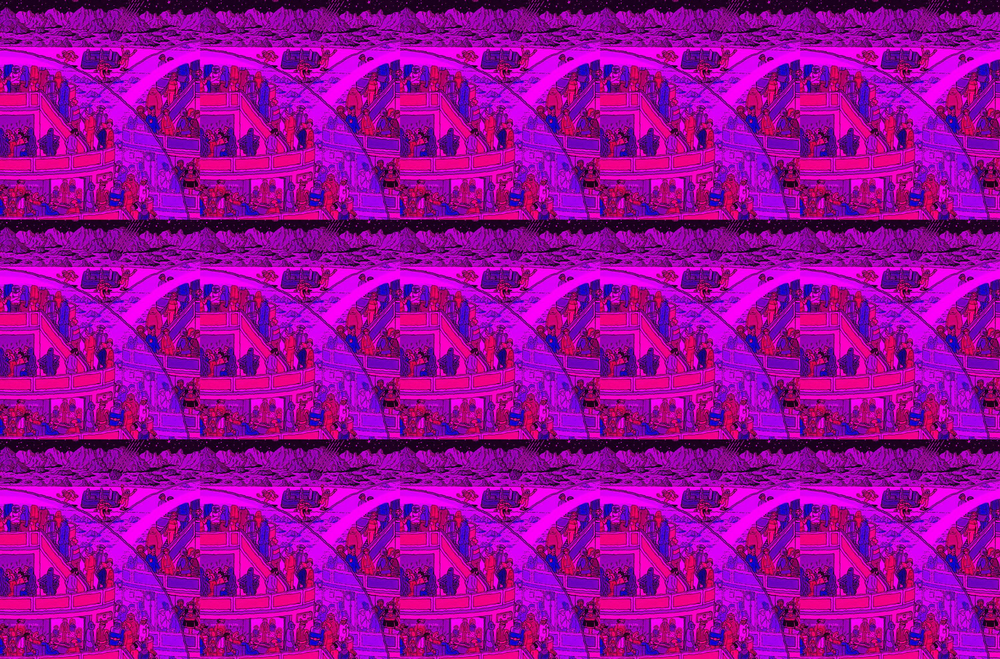

In [11]:
image_path = 'Waldo_extension.jpg'
image = Image.open(image_path)
display(image)

Extension 2:

In [10]:
from PIL import Image

image_path = 'illusion3.jpg'

image = Image.open(image_path)

image.size

(800, 600)

In [9]:
from PIL import Image

def create_image_puzzle(image_path, rows, columns, output_folder):
   
    img = Image.open(image_path)
   
    image_width = img.size[0]

    image_height = img.size[1]
   
    piece_width = (image_width/columns)
    piece_height = (image_height/rows)

    for row in range(rows):
            for col in range(columns):
                
                crop_box = (col*piece_width, row*piece_height, (col+1)*piece_width, (row+1)*piece_height)
                piece = img.crop(crop_box)

                piece.save(output_folder + "/" + "piece_%d_%d.jpg" %(row, col))

input_image_path = "illusion3.jpg"
rows = 4
columns = 4
output_folder = "extension_2"

create_image_puzzle(input_image_path, rows, columns, output_folder)

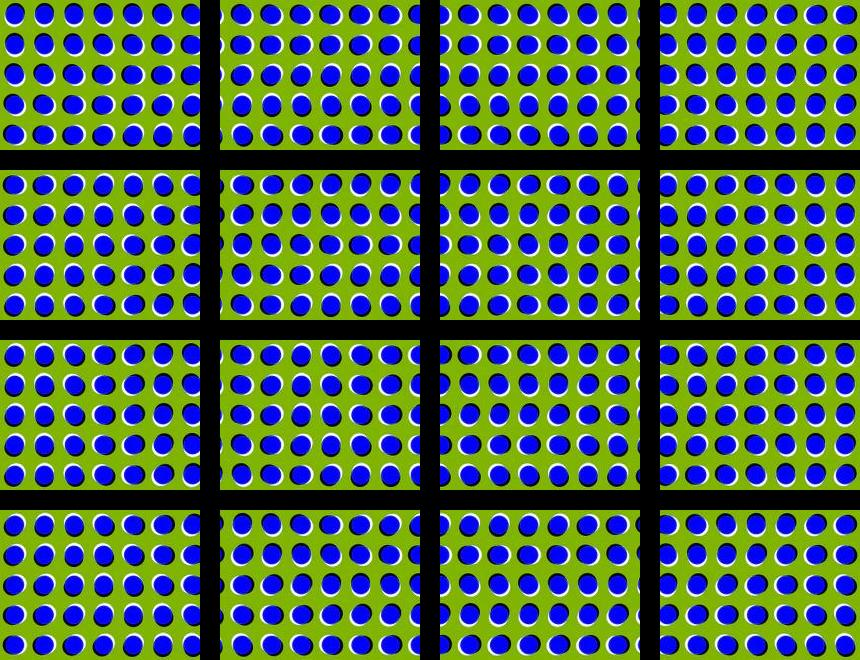

In [8]:
import os

def puzzle_board(input_folder, rows, columns):
    piece_files = sorted([f for f in os.listdir(input_folder) if f.startswith("piece_")])
    first_piece = Image.open('extension_2/piece_1_2.jpg')
    piece_width, piece_height = (first_piece.size[0], first_piece.size[1])

    assembled_image_extension = Image.new("RGB", (860,660))

    for row in range(rows):
        for col in range(columns):
            piece = Image.open(input_folder + "/" + "piece_%d_%d.jpg" %(row, col))
            left = col*(piece_width+20)
            upper = row*(piece_height+20)
            right = left + piece_width
            lower = upper + piece_height
            
            assembled_image_extension.paste(piece, (left, upper, right, lower))

    assembled_image_extension.save('extension_2.jpg')

rows = 4
columns = 4
input_folder = "extension_2"
puzzle_board(input_folder, rows, columns)

image_path = 'extension_2.jpg'
image2 = Image.open(image_path)
display(image2)

## Extensions

Congratulations on completing the core tasks! If you have generated the augmented, tiled images and put them back together, and  saved/displayed them as expected, you've earned 26/30 points.

The remaining 4/30 are a chance for you to earn credit for exploring parts of resources mentioned in this project and digging deeper to express your creativity! This is entirely optional; 26/30 is a B and is a perfectly respectable place to stop. Extensions are open-ended and exist to compliment the structured core project. Explore and learn something new that interests you! Concentrating your energy on 1-2 "deep" extensions that challenge you will earn you more points than many small, "shallow" extensions.

You can pick you own topics that interest you. Here are a few examples:

* Try showing the image tiles as a single image side by side like an actual [puzzle](https://www.pinterest.com/pin/432908582905013211/). You can save the image following the code examples above. Name the result image (`Extension1.jpg`).

* Randomize the tiles so that it looks like a real puzzle, and then present it. 

* Can you make a puzzle from an image and put it back together if it is not a square matrix? (e.g. rows = 4, columns = 3, number of tiles = 12).

* Any other method you can add to make to make the puzzle creation and puzzle solving interesting for people to try. Have fun!


## Checklist

Before you submit:

* Make sure to edit the readme file to add your name.

* Make sure you have answered each questions. You can find sample inputs and output image folders in the project directory.

* You have added your code and the output image is displayed in the notebook. (you can also save each of them, make sure to name them using the task/extension number).
    Submit your code to Github Classroom assignment link.

* You are welcome to use other images from your collection. Have fun!